# Notebook 01: Seeing Water from Space

**Goal:** Download a Sentinel-2 satellite image of Bangalore and visualize it — focusing on how different band combinations reveal water bodies, vegetation, and built-up areas.

**Why this matters for civil engineers:**
- Monitor lake health, encroachment, and water spread
- Track urban expansion into flood-prone areas
- Assess vegetation cover in watersheds
- All using free, regularly updated satellite data

**Author:** Dr. Sindhu | **Organization:** Smart Bhujal | **Contact:** sindhura@smartbhujal.com

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pystac_client
import planetary_computer
import rasterio
from rasterio.windows import from_bounds as window_from_bounds
from pyproj import Transformer

import sys, os
sys.path.insert(0, os.path.dirname(os.path.abspath(".")))
from utils import make_rgb, normalize_band, plot_image, plot_comparison

## Step 1: Search for Sentinel-2 imagery over Bangalore

Sentinel-2 is a European Space Agency satellite that captures the Earth every 5 days in 13 spectral bands at 10-20m resolution — **completely free**. That's detailed enough to see individual buildings and small water bodies.

We search using **STAC** (SpatioTemporal Asset Catalog) — a standard API for finding satellite data.

In [2]:
# Bangalore area — covering major lakes (Bellandur, Varthur, Ulsoor, Hebbal)
bbox = [77.55, 12.90, 77.75, 13.05]  # [west, south, east, north]

catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)

search = catalog.search(
    collections=["sentinel-2-l2a"],
    bbox=bbox,
    datetime="2024-01-01/2024-03-31",  # Dry season — clearer skies, water bodies more defined
    query={"eo:cloud_cover": {"lt": 5}},
    sortby="properties.eo:cloud_cover",
    max_items=5,
)

items = list(search.items())
print(f"Found {len(items)} cloud-free scenes")
for item in items:
    print(f"  {item.id} | Cloud: {item.properties['eo:cloud_cover']:.1f}% | Date: {item.datetime.date()}")

Found 5 cloud-free scenes
  S2B_MSIL2A_20240323T050649_R019_T43PGQ_20240323T095105 | Cloud: 0.0% | Date: 2024-03-23
  S2B_MSIL2A_20240313T050649_R019_T43PGQ_20240313T171334 | Cloud: 0.0% | Date: 2024-03-13
  S2B_MSIL2A_20240222T050829_R019_T43PGQ_20240222T101916 | Cloud: 0.5% | Date: 2024-02-22
  S2B_MSIL2A_20240212T050939_R019_T43PGQ_20240212T092405 | Cloud: 0.7% | Date: 2024-02-12
  S2B_MSIL2A_20240123T051119_R019_T43PGQ_20240123T092303 | Cloud: 0.1% | Date: 2024-01-23


In [3]:
item = items[1]
print(f"Selected: {item.id}")
print(f"\nAvailable bands:")
for key in sorted(item.assets.keys()):
    if key.startswith("B"):
        print(f"  {key}: {item.assets[key].extra_fields.get('eo:bands', [{}])[0].get('common_name', '')}")

Selected: S2B_MSIL2A_20240313T050649_R019_T43PGQ_20240313T171334

Available bands:
  B01: coastal
  B02: blue
  B03: green
  B04: red
  B05: rededge
  B06: rededge
  B07: rededge
  B08: nir
  B09: 
  B11: swir16
  B12: swir22
  B8A: rededge


## Step 2: Download the bands we need

For water resources work, we need more than just RGB:

| Band | Name | Resolution | Why we need it |
|------|------|-----------|----------------|
| B02 | Blue | 10m | RGB display, water penetration |
| B03 | Green | 10m | RGB display, **NDWI water detection** |
| B04 | Red | 10m | RGB display, NDVI vegetation |
| B08 | NIR | 10m | **NDWI, NDVI** — key for water vs. vegetation |
| B11 | SWIR | 20m | **MNDWI** — better water detection in urban areas |

In [4]:
def read_band_from_stac(item, band_name, bbox):
    """Read a band from a STAC item, cropped to bbox (lat/lon)."""
    href = item.assets[band_name].href
    with rasterio.open(href) as src:
        transformer = Transformer.from_crs("EPSG:4326", src.crs, always_xy=True)
        west, south, east, north = bbox
        left, bottom = transformer.transform(west, south)
        right, top = transformer.transform(east, north)
        window = window_from_bounds(left, bottom, right, top, transform=src.transform)
        data = src.read(1, window=window).astype(np.float32)
        transform = src.window_transform(window)
        crs = src.crs
    return data, transform, crs

print("Downloading bands from cloud storage...")
red, transform, data_crs = read_band_from_stac(item, "B04", bbox)
green, _, _ = read_band_from_stac(item, "B03", bbox)
blue, _, _ = read_band_from_stac(item, "B02", bbox)
nir, _, _ = read_band_from_stac(item, "B08", bbox)
swir, _, _ = read_band_from_stac(item, "B11", bbox)

# SWIR is 20m resolution — resample to 10m to match other bands
from scipy.ndimage import zoom
if swir.shape != red.shape:
    scale_y = red.shape[0] / swir.shape[0]
    scale_x = red.shape[1] / swir.shape[1]
    swir = zoom(swir, (scale_y, scale_x), order=1)
    print(f"Resampled SWIR from 20m to 10m: {swir.shape}")

print(f"Image size: {red.shape[0]} x {red.shape[1]} pixels")
print(f"Coverage: {red.shape[0]*10/1000:.1f} x {red.shape[1]*10/1000:.1f} km")
print(f"CRS: {data_crs}")

Resampled SWIR from 20m to 10m: (1683, 2154)
Image size: 1683 x 2154 pixels
Coverage: 16.8 x 21.5 km
CRS: EPSG:32643


## Step 3: True-Color RGB — What we see from space

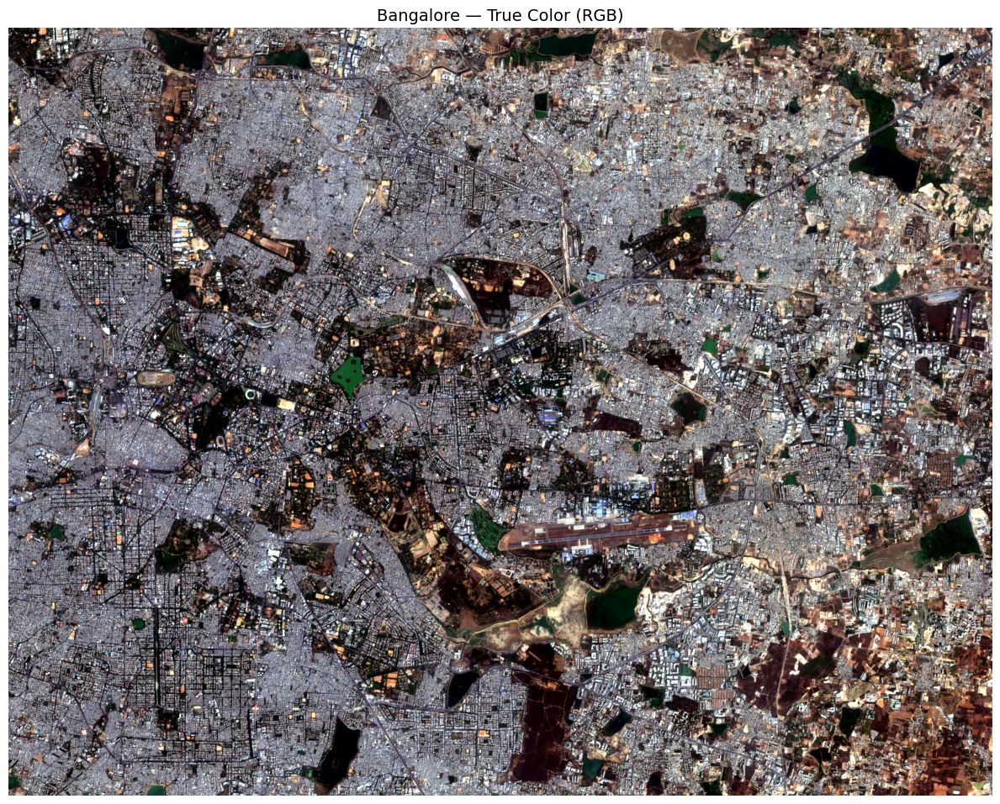

Can you spot the lakes? They appear as dark patches.
The gray areas are dense urban, green patches are parks/vegetation.


In [5]:
rgb = make_rgb(red, green, blue)
plot_image(rgb, title="Bangalore — True Color (RGB)", figsize=(12, 10))
plt.show()
print("Can you spot the lakes? They appear as dark patches.")
print("The gray areas are dense urban, green patches are parks/vegetation.")

## Step 4: False-Color Composites — Seeing the invisible

Different band combinations reveal different features. This is the **superpower of satellite imagery** — we can see things invisible to the naked eye.

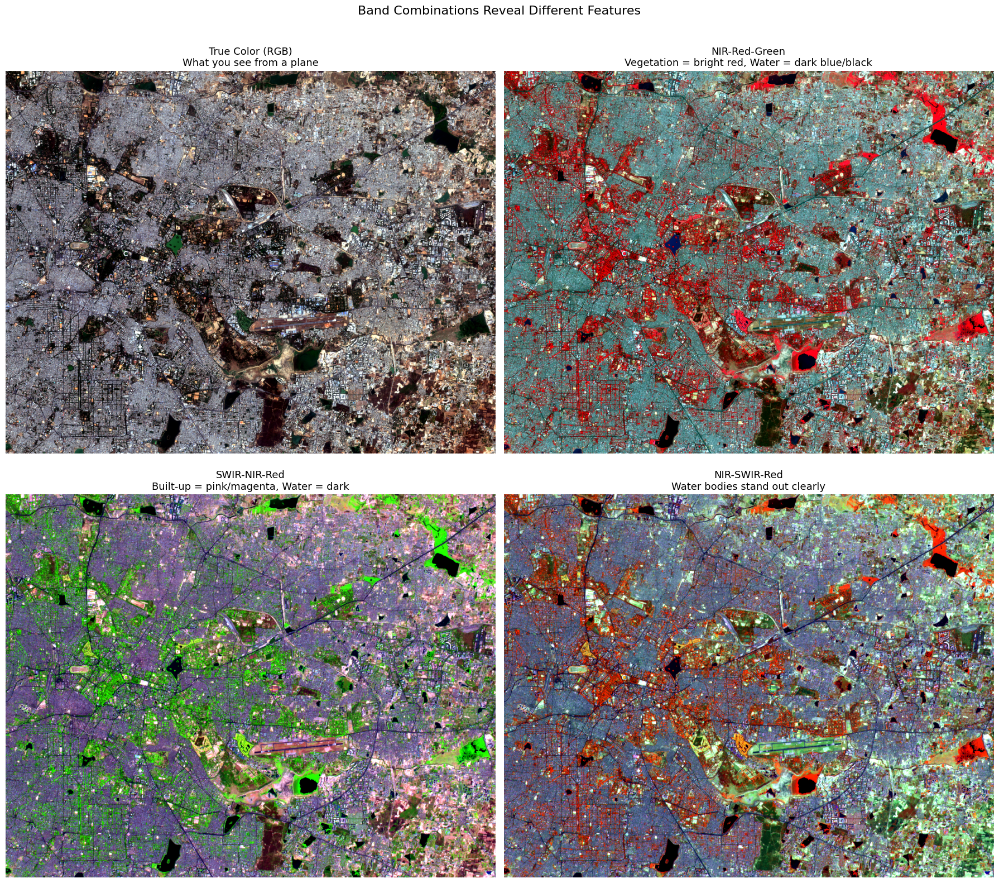

In [6]:
# False Color (NIR, Red, Green) — vegetation is bright red, water is dark
false_color_veg = make_rgb(nir, red, green)

# False Color (SWIR, NIR, Red) — water is very dark, built-up is pink/magenta
false_color_urban = make_rgb(swir, nir, red)

# False Color (NIR, SWIR, Red) — water stands out clearly
false_color_water = make_rgb(nir, swir, red)

fig, axes = plt.subplots(2, 2, figsize=(18, 16))

axes[0, 0].imshow(rgb)
axes[0, 0].set_title("True Color (RGB)\nWhat you see from a plane", fontsize=13)
axes[0, 0].axis("off")

axes[0, 1].imshow(false_color_veg)
axes[0, 1].set_title("NIR-Red-Green\nVegetation = bright red, Water = dark blue/black", fontsize=13)
axes[0, 1].axis("off")

axes[1, 0].imshow(false_color_urban)
axes[1, 0].set_title("SWIR-NIR-Red\nBuilt-up = pink/magenta, Water = dark", fontsize=13)
axes[1, 0].axis("off")

axes[1, 1].imshow(false_color_water)
axes[1, 1].set_title("NIR-SWIR-Red\nWater bodies stand out clearly", fontsize=13)
axes[1, 1].axis("off")

plt.suptitle("Band Combinations Reveal Different Features", fontsize=16, y=1.01)
plt.tight_layout()
plt.show()

## Step 5: Individual bands — what each one captures

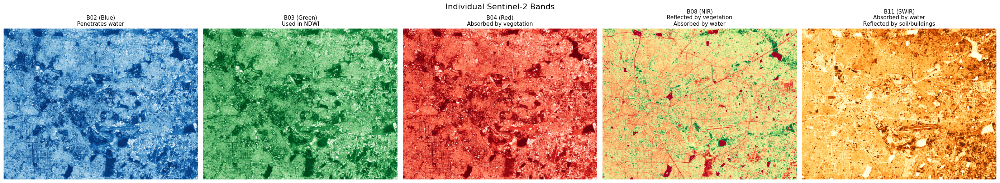

Key insight: Water ABSORBS NIR and SWIR light but REFLECTS visible light.
This difference is how we detect water bodies automatically (next notebook).


In [7]:
fig, axes = plt.subplots(1, 5, figsize=(28, 5))

bands = [blue, green, red, nir, swir]
names = ["B02 (Blue)\nPenetrates water", "B03 (Green)\nUsed in NDWI", 
         "B04 (Red)\nAbsorbed by vegetation", "B08 (NIR)\nReflected by vegetation\nAbsorbed by water",
         "B11 (SWIR)\nAbsorbed by water\nReflected by soil/buildings"]
cmaps_list = ["Blues_r", "Greens_r", "Reds_r", "RdYlGn", "YlOrBr"]

for ax, band, name, cmap in zip(axes, bands, names, cmaps_list):
    ax.imshow(normalize_band(band), cmap=cmap)
    ax.set_title(name, fontsize=11)
    ax.axis("off")

plt.suptitle("Individual Sentinel-2 Bands", fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

print("Key insight: Water ABSORBS NIR and SWIR light but REFLECTS visible light.")
print("This difference is how we detect water bodies automatically (next notebook).")

## Step 6: Save data for the next notebooks

In [8]:
output_dir = os.path.join("..", "data", "sample")
os.makedirs(output_dir, exist_ok=True)

# Save as 5-band GeoTIFF: [Blue, Green, Red, NIR, SWIR]
stack = np.stack([blue, green, red, nir, swir])
profile = {
    "driver": "GTiff", "dtype": "float32",
    "width": red.shape[1], "height": red.shape[0],
    "count": 5, "crs": data_crs, "transform": transform,
}

output_path = os.path.join(output_dir, "bangalore_5band.tif")
with rasterio.open(output_path, "w", **profile) as dst:
    dst.write(stack)
    for i, name in enumerate(["Blue", "Green", "Red", "NIR", "SWIR"], 1):
        dst.set_band_description(i, name)

print(f"Saved 5-band stack: {output_path}")
print(f"Shape: {stack.shape} | Size: {os.path.getsize(output_path) / 1e6:.1f} MB")

Saved 5-band stack: ../data/sample/bangalore_5band.tif
Shape: (5, 1683, 2154) | Size: 72.5 MB


## Key Takeaways

1. **Sentinel-2 is free** — 10m resolution, every 5 days, global coverage
2. **NIR and SWIR bands** are critical for water resources — water absorbs them strongly
3. **False-color composites** instantly reveal water bodies, vegetation, and built-up areas
4. For civil engineers: this data can monitor **lake health, urban encroachment, flood extent, and watershed vegetation** — all without field visits

**Next:** In Notebook 02, we compute water indices (NDWI, MNDWI) and extract water body boundaries automatically.